# Part II: GANs
In this second part, we will attempt to create more convincing images using GANs (Generative Adversarial Networks). 
First, without using interpolated images and in a second iteration, with interpolated images in the latent space.
GANs have been introduced in the seminal paper by Goodfellow et al., [Generative Adversarial Networks](https://arxiv.org/abs/1406.2661).
The key idea is that two NNs compete against each other in a min-max game where the generator generates a fake image which is supposed to fool the disciminator. 
Using this generator, we can sample fake and real images using an existing dataset. 
The discriminator classifies these sampled images into real or fake, i.e. it performs binary classification. 
For more details, I refer you to the [original paper](https://arxiv.org/abs/1406.2661).

![https://towardsdatascience.com/generative-adversarial-networks-gans-2231c5943b11](https://miro.medium.com/max/2000/1*XKanAdkjQbg1eDDMF2-4ow.png)

Note that no actual labels are required in this formulation since GANs are **generative models**. 
However, the FASHION-MNIST dataset is a labeled dataset so the labels can be used to give the discriminator a better understanding of the data. 
In fact, [C-GAN](https://keras.io/examples/generative/conditional_gan/) (Conditional GAN) and [SGAN](https://machinelearningmastery.com/semi-supervised-generative-adversarial-network/) (Semi-Supervised GAN) make use of this information. 

The following questions will be investigated:
* How can labeled data be used to train a GAN and how does this affect the performance?
* How does the quality of the autoencoder images change when using GANs? Do artifacts still arise?
* How can interpolations in the latent space and GANs be combined?

To this end, we will not generate new images by sampling from a normal distribution in the latent space and then decoding this sample to obtain a new image, but we will generate images by feeding them through the autoencoder, which in the following will be called the generator. 
When using latent space interpolations, the decoded interpolations will be considered fake, generated images. 

## 0. Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import os
import datetime
import imageio
from IPython.display import Image
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

import torchvision
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torchvision.datasets import FashionMNIST, MNIST
from torch.utils.data import DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision import transforms
from torch.utils.tensorboard import SummaryWriter
from torchsummary import summary
!pip install torchviz
from torchviz import make_dot

BATCH_SIZE = 128
EPSILON = 1e-12
STEPS = 100
EVAL_EVERY = 10
EPOCHS = 50
ndf = 64

## 1. Data Loading

In [2]:
transform = transforms.Compose([transforms.ToTensor()])
# training_data = MNIST('data/mnist/train', download=True, train=True, transform=transform)
# test_data = MNIST('data/mnist/test', download=True, train=False, transform=transform)
training_data = FashionMNIST('data/fmnist/train', download=True, train=True, transform=transform)
test_data = FashionMNIST('data/fmnist/test', download=True, train=False, transform=transform)

indices = list(range(len(training_data)))
np.random.shuffle(indices)
split = int(0.2 * len(training_data))
train_sampler = SubsetRandomSampler(indices[:split])
val_sampler = SubsetRandomSampler(indices[split:])

train_loader = DataLoader(training_data, sampler=train_sampler, batch_size=BATCH_SIZE)
val_loader = DataLoader(training_data, sampler=val_sampler, batch_size=BATCH_SIZE)
test_loader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=True)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
num_classes = 10
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
device

'cuda'

In [3]:
dataiter = iter(train_loader)
print(dataiter)
images, labels = dataiter.next()
images = images.to(device)
labels = labels.to(device)
input_shape = images.shape
images, labels

(tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]]],
 
 
         [[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]]],
 
 
         [[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000

## 2. Model Definition
The generator is identical to the autoencoder used in Part I. 
However, the classifier from Part I will have to be slightly adjusted to fit the GAN training paradigm. 
Instead of a final softmax layer, we will take the last layer to be a linear layer of size `num_classes + 1` with a sigmoid activation function applied to the first element (binary real/fake classification of the discriminator) and a softmax function applied to the remaining `num_classes` elements (classifier).
For a more thorough explanation on this, please refer to the blogpost on [SGANs](https://machinelearningmastery.com/semi-supervised-generative-adversarial-network/).
The networks can be visualized using the `torchviz` library below and their outputs can be used to discriminate and classify (real/fake) images and set up the losses for the networks.

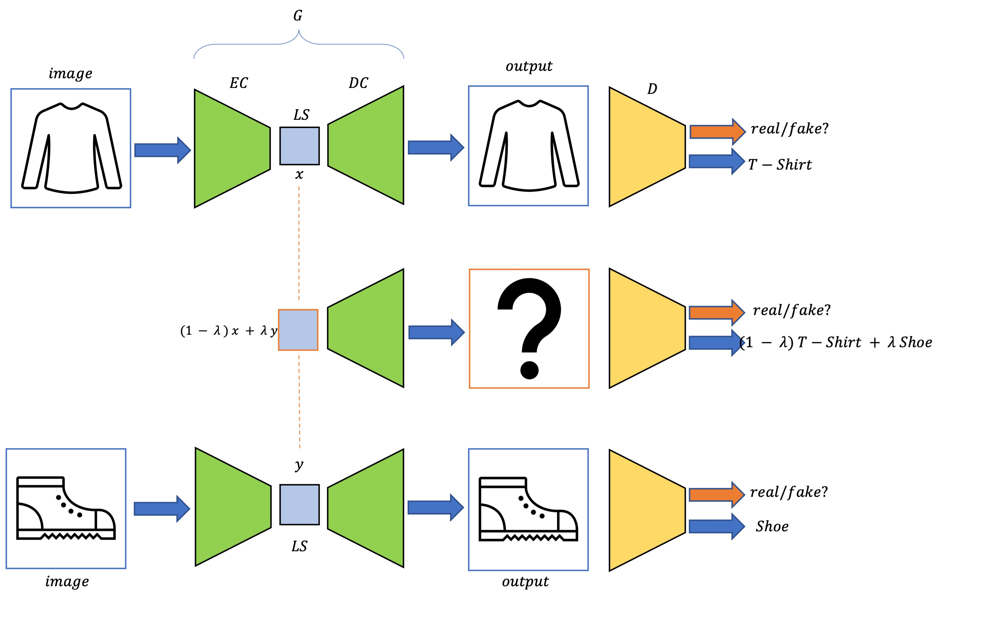

In [4]:
class Generator(nn.Module):
    def __init__(self, ndf=ndf):
        super(Generator, self).__init__()
        self.ndf = ndf
        self.encoder = nn.Sequential(
            nn.Conv2d(input_shape[1], ndf // 4, 3, padding=1),
            nn.BatchNorm2d(ndf // 4),
            nn.ReLU(),
            nn.AvgPool2d(2, 2),
            nn.Conv2d(ndf // 4, ndf // 2, 3, padding=1),
            nn.BatchNorm2d(ndf // 2),
            nn.ReLU(),
            nn.AvgPool2d(2, 2),
            nn.Conv2d(ndf // 2, ndf, 7)
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(ndf, ndf // 2, 7),
            nn.Conv2d(ndf // 2, ndf // 2, (3, 3), padding=1),
            nn.BatchNorm2d(ndf // 2),
            nn.ReLU(),
            nn.ConvTranspose2d(ndf // 2, ndf // 4, 3, stride=2, padding=1, output_padding=1),
            nn.Conv2d(ndf // 4, ndf // 4, (3, 3), padding=1),
            nn.BatchNorm2d(ndf // 4),
            nn.ReLU(),
            nn.ConvTranspose2d(ndf // 4, input_shape[1], 3, stride=2, padding=1, output_padding=1),
            nn.Conv2d(input_shape[1], input_shape[1], (3, 3), padding=1),
            nn.Sigmoid()
        )
    
    def encode(self, x):
        return self.encoder(x)
    
    def decode(self, x):
        return self.decoder(x)
    
    def forward(self, x):
        return self.decoder(self.encoder(x))
    

class Discriminator(nn.Module):
    def __init__(self, num_classes=num_classes, input_shape=input_shape, ndf=ndf):
        super(Discriminator, self).__init__()
        self.ndf = ndf

        self.model = nn.Sequential(
            nn.Conv2d(input_shape[1], ndf // 4, (3, 3)),
            nn.BatchNorm2d(ndf // 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.AvgPool2d(2, 2),
            nn.Conv2d(ndf // 4, ndf // 2, (3, 3)),
            nn.BatchNorm2d(ndf // 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.AvgPool2d(2, 2),
            nn.Conv2d(ndf // 2, ndf, (3, 3)),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            nn.AvgPool2d(2, 2),
            nn.Flatten(),
            nn.Linear(ndf, ndf // 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(ndf // 2, ndf // 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(ndf // 4, num_classes + 1)
        )

        # self.model = nn.Sequential(
        #     nn.Conv2d(input_shape[1], 16, (3, 3), padding=0),
        #     nn.ReLU(),
        #     nn.MaxPool2d(2, 2),
        #     nn.Conv2d(16, 32, (3, 3), padding=0),
        #     nn.ReLU(),
        #     nn.MaxPool2d(2, 2),
        #     nn.Conv2d(32, 64, (3, 3), padding=0),
        #     nn.ReLU(),
        #     nn.MaxPool2d(2, 2),
        #     nn.Flatten(),
        #     nn.Linear(64, 32),
        #     nn.ReLU(),
        #     nn.Linear(32, 16),
        #     nn.ReLU(),
        #     nn.Linear(16, num_classes+1)
        # )

    def discriminate(self, x):
      return self(x)[0]

    def classify(self, x):
      return self(x)[1]
    
    def forward(self, x):
        x = self.model(x)
        real_fake_pred = nn.Sigmoid()(x[:, 0])
        class_pred = nn.Softmax(dim=1)(x[:, 1:])
        return real_fake_pred, class_pred
        
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

netG = Generator().to(device)
netD = Discriminator().to(device)

netG.apply(weights_init)
netD.apply(weights_init)

summary(netG, input_shape[1:])
summary(netD, input_shape[1:])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 28, 28]             160
       BatchNorm2d-2           [-1, 16, 28, 28]              32
              ReLU-3           [-1, 16, 28, 28]               0
         AvgPool2d-4           [-1, 16, 14, 14]               0
            Conv2d-5           [-1, 32, 14, 14]           4,640
       BatchNorm2d-6           [-1, 32, 14, 14]              64
              ReLU-7           [-1, 32, 14, 14]               0
         AvgPool2d-8             [-1, 32, 7, 7]               0
            Conv2d-9             [-1, 64, 1, 1]         100,416
  ConvTranspose2d-10             [-1, 32, 7, 7]         100,384
           Conv2d-11             [-1, 32, 7, 7]           9,248
      BatchNorm2d-12             [-1, 32, 7, 7]              64
             ReLU-13             [-1, 32, 7, 7]               0
  ConvTranspose2d-14           [-1, 16,

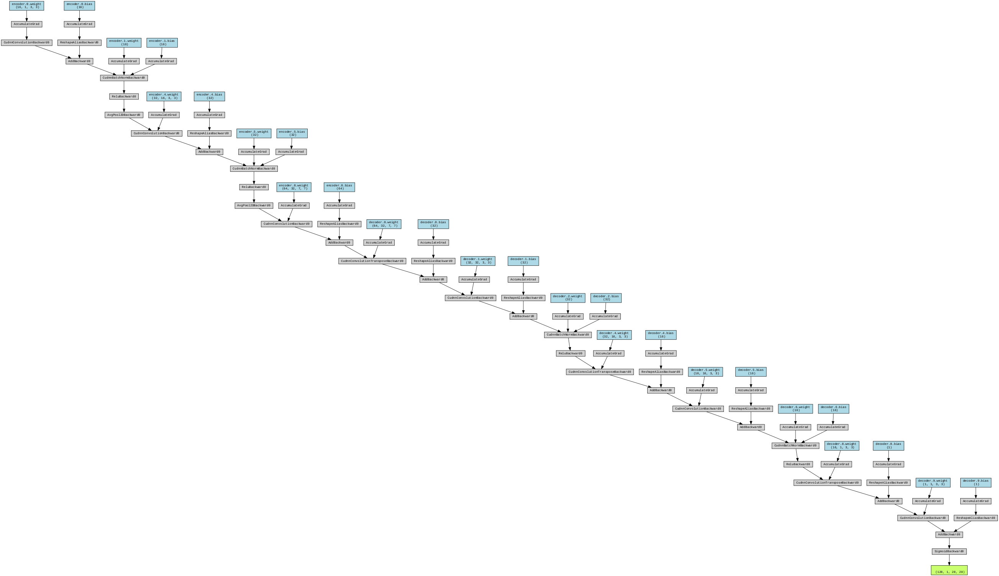

In [5]:
make_dot(netG(images), params=dict(list(netG.named_parameters()))).render("netG", format="png")
Image(filename="netG.png")

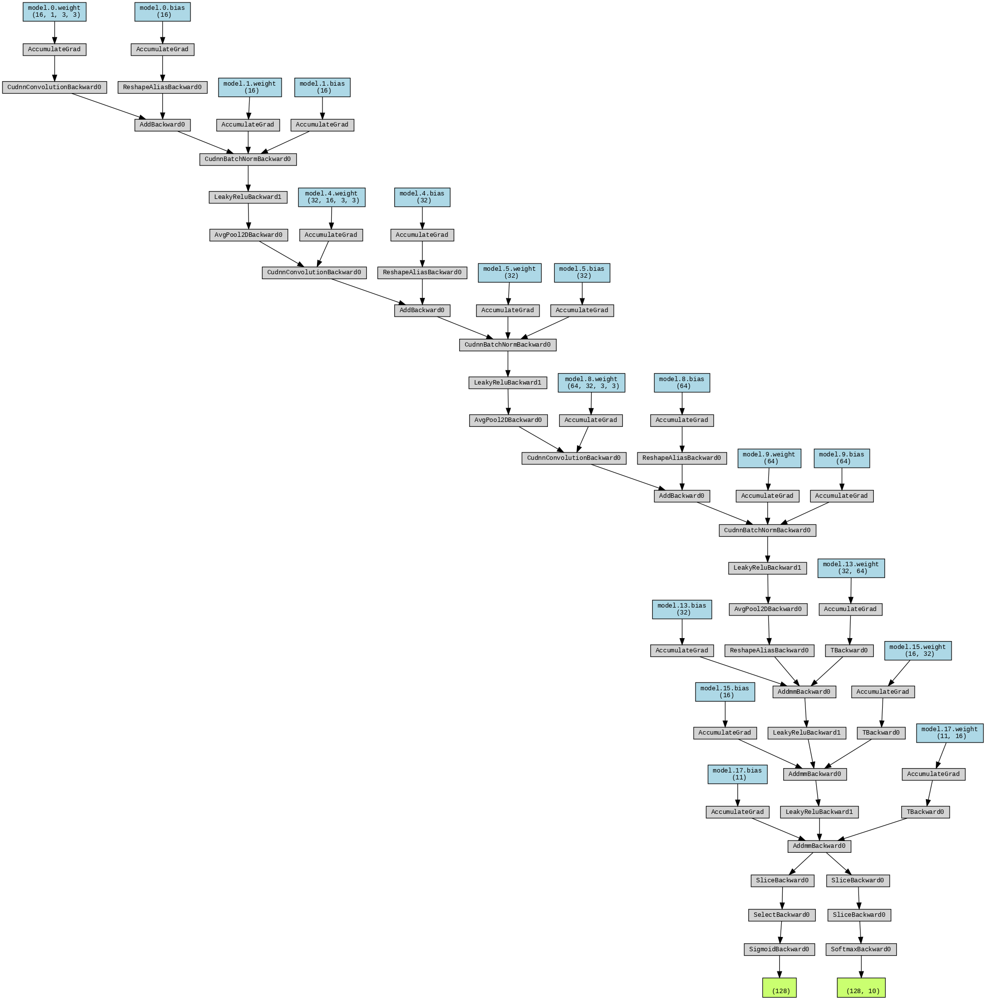

In [6]:
make_dot(netD(images), params=dict(list(netD.named_parameters()))).render("netD", format="png")
Image(filename="netD.png")

### Loss Functions

As in the previous part, we define our regression, classification, and interpolation losses.

In [7]:
def normalize(*inputs, device=device):
    '''
    Normalize inputs array to sum up to 1 and place on device

    Arguments:
      inputs: array-like argument of shape (n,) with non-negative values
      device: string specifying the device to place the output on (cpu or cuda)

    Returns;
      inputs: Normalized inputs which sum up to 1
    '''
    if any(np.array(inputs) < 0):
        raise ValueError(f"All inputs required to be non-negative but found inputs {inputs}")
    inputs = torch.tensor(inputs, dtype=torch.float, requires_grad=False)
    inputs = inputs / torch.sum(inputs)
    return inputs.float().to(device)

def get_lambdas(N, alpha=None, seed=42, device=device):
    '''
    Sample N times from seeded dirichlet distribution with concentration 
    parameter alpha and place on device.

    Arguments:
      N: int specifying the number of samples to be drawn
      alpha: float specifying concentration parameter
      seed: int, seed for reproducibility
      device: string epcifying the device to place the result on

    Returns:
      lambdas: torch Tensor of shape (N, N) from the Dirichlet distribution
    '''
    if alpha is None:
        alpha = N ** 2
    alpha *= torch.ones(N)
    # if num_lambdas == 0:
    #     return None
    
    # corners = np.arange(N + 1) % N
    # lambdas = torch.zeros((num_lambdas * N, N))
    # for i in range(N):
    #     lambdas[num_lambdas * i:num_lambdas * (i + 1), corners[i]] = torch.linspace(0, 1, num_lambdas + 2)[1:-1]
    #     lambdas[num_lambdas * i:num_lambdas * (i + 1), corners[i+1]] = 1 - lambdas[num_lambdas * i:num_lambdas * (i + 1), corners[i]]
    
    torch.manual_seed(seed)
    dist = torch.distributions.dirichlet.Dirichlet(alpha)
    lambdas = dist.rsample((N,))
    return lambdas.to(device)

def estimate_concentration(observations, learning_rate=1e-5, steps=STEPS):
    '''
    Perform projected gradient ascent to maximize the log-likelihood w.r.t. the
    concentration parameters, i.e., solve the restricted problem
    max_alpha 1/N * sum_i^N log(gamma(sum_k alpha_ik)) 
              - sum_k log(gamma(alpha_ik)) + sum_k (alpha_ik - 1) * y_ik,
              s.t. alpha > 0

    Arguments:
        observations: torch Tensor of shape (N, num_classes) with observations 
                      from a Dirichlet distribution
        learning_rate: float, learning rate for gradient ascent
        steps: int, number of optimization steps

    Returns:
        concentration: torch Tensor of shape (N,) maximizing the log-likelihood
    '''
    N, _ = observations.shape
    concentration = torch.mean(observations, axis=0)
    for i in range(steps):
        prev = concentration
        grad = 1/N * (torch.digamma(torch.sum(concentration)) - torch.digamma(concentration) + 1/N * torch.sum(torch.log(observations)))
        concentration = F.threshold(concentration + learning_rate * grad, 0, EPSILON)
        # Stop if no significant change in the update
        if torch.mean(torch.square(prev - concentration)) < 1e-9:
            break
    return concentration

def kl_divergence_dirichlet(alpha, beta):
    '''
    KL Divergence between two Dirichlet distributions P and Q with concentration
    parameters alpha and beta, resp.

    Arguments:
        alpha:
        beta:

    Returns:
        result: float, KL(P || Q) where P, Q are Dirichlet distributions with 
                concentration parameters alpha, beta, resp.
    '''
    result = torch.lgamma(torch.sum(alpha)) - torch.lgamma(torch.sum(beta))
    result += torch.sum(torch.lgamma(beta) - torch.lgamma(alpha))
    result += torch.sum((alpha - beta) * (torch.digamma(alpha) - torch.digamma(torch.sum(alpha))))
    return result

def js_divergence_dirichlet(alpha, beta):
    '''
    Jason-Shannon Divergence between two Dirichlet distributions with
    concentration parameters alpha and beta, resp.

    Arguments:
        alpha:
        beta:

    Returns:
        result: float, JS(P || Q) where P, Q are Dirichlet distributions with 
                concentration parameters alpha, beta, resp.
    '''
    return 0.5 * (kl_divergence_dirichlet(alpha, beta) + kl_divergence_dirichlet(beta, alpha))

def L_regr(output, target, loss_func=nn.MSELoss()):
    return loss_func(output, target)

def L_class(pred, target, loss_func=nn.CrossEntropyLoss()):
    return loss_func(pred, target)

def L_inter(pred_dec, encoded, target, inter=False, alpha=None, num_classes=num_classes, loss_func=nn.CrossEntropyLoss()):
    N = encoded.shape[0]
    if not inter:
        return loss_func(pred_dec, target)
    if alpha is None:
        alpha = N ** 2
    
    # CL(DC(sum_i lambda_i * EC(x_i)))
    lambdas = get_lambdas(N)
    pred_inter = netD.classify(netG.decode(torch.tensordot(lambdas, encoded, dims=[[1], [0]])))
    
    # sum_i lambda_i * y_i
    eps = 1e-12
    target_inter = torch.tensordot(lambdas, F.one_hot(target, num_classes).float(), dims=[[1], [0]]) + eps
    target_inter /= torch.unsqueeze(torch.sum(target_inter, axis=1), 1)
    
    alpha = estimate_concentration(target_inter)
    beta = estimate_concentration(pred_inter)
    
    return loss_func(pred_dec, target) + js_divergence_dirichlet(alpha, beta) #kl_divergence_dirichlet(alpha, beta)

### Define Optimizer

Training GANs is quite a lot more difficult than training the usual neural networks due to phenomena such as mode collapse which occurs when one of the networks becomes so good at generating or discriminating, resp., that it dominates the other network and cannot improve as easily.
Thus, training should be tuned in way such that both networks improve at a similar rate.
The values for the optimizer and training scheme are taken from the [DCGAN Tutorial](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html).


In [8]:
# Initialize BCELoss function
criterion = nn.BCELoss

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(input_shape, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

lr = 2e-4

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5
# Setup Adam optimizers for both G and D
optimizerGD = optim.Adam([{'params': netG.parameters()},
                          {'params': netD.parameters()}], 
                         lr=lr, betas=(beta1, 0.999)
                        )
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))

### Training and Loss Monitoring

During training, the discriminator and generator losses need to be closely monitored to ensure proper connvergence. 
There's a few ways the training scheme can be designed. 
In particular, if the focus was generating images, one should also generate an image by decoding a random sample and performing an update step see Part 1b) ). 
However, our focus lies in interpolating and classifying images.
The training process in a GAN is defined as a coordinate optimization problem which first performs an optimization in terms of the parameters of $G$ and then a step in terms of the parameters of $D$.

In [9]:
%reload_ext tensorboard
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 332), started 0:19:45 ago. (Use '!kill 332' to kill it.)

<IPython.core.display.Javascript object>

In [10]:
inter = True
g_losses = []
d_losses = []
alpha_gan, alpha_regr, alpha_class, alpha_inter = normalize(1e-2, 1e-1, 1e0, 1e-2)

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
writer = SummaryWriter(logdir)
writer.add_graph(netD, images)
writer.add_graph(netG, images)
features = images.view(images.shape[0], -1)

counter = 0

for epoch in range(EPOCHS):  # loop over the dataset multiple times
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        images, class_labels = data
        images = images.to(device)
        class_labels = class_labels.to(device)
        N = images.shape[0]

        ### Part 0: Classic training loop
        netG.zero_grad()
        netD.zero_grad()

        ### Part 1 a): Update supervised discriminator
        # zero the parameter gradients
        netD.zero_grad()

        label = torch.full((N,), real_label, dtype=torch.float, device=device)
        # label[:N] = real_label
        fake_real_pred = netD.discriminate(images)
        loss_D_real = criterion()(fake_real_pred, label)
        loss_D_real.backward(retain_graph=True)
        D_x = fake_real_pred.mean().item()


        label = torch.full((2 * N,), fake_label, dtype=torch.float, device=device)
        encoded = netG.encode(images)
        decoded = netG.decode(encoded)
        pred_dec = netD.classify(decoded)
        
        lambdas = get_lambdas(N)
        weight = torch.repeat_interleave(torch.tensor([alpha_gan, inter * alpha_inter]), N).to(device)
        interpolated = netG.decode(torch.tensordot(lambdas, encoded, dims=[[1], [0]]))
        fake_real_pred, class_pred = netD(torch.cat((decoded.detach(), interpolated.detach())))

        loss_D_fake = criterion(weight=weight)(fake_real_pred, label)
        loss_gan = loss_D_real + loss_D_fake
        loss_class = L_class(class_pred[:N], class_labels)
        loss_inter = L_inter(pred_dec, encoded.detach(), class_labels, inter=inter)
        
        # Calculate gradients for D in backward pass
        total_loss_super = torch.stack((torch.tensor(1., device=device), alpha_class, alpha_inter)) @ torch.stack((loss_gan, loss_class, loss_inter))
        total_loss_super.backward()
        errD = loss_gan
        D_x = fake_real_pred.mean().item()

        optimizerD.step()

        ### Part 1 b): Update unsupervised discriminator
        # noise = torch.randn(3 * N, 64, 1, 1, device=device)
        # # Generate fake image batch with G
        # fake = netG.decode(noise)
        # label = torch.fill_(label, fake_label)
        # # Classify all fake batch with D
        # fake_real_pred = netD.discriminate(fake.detach())
        # # Calculate D's loss on the all-fake batch
        # loss_D_fake = criterion()(fake_real_pred, label)
        # # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        # # loss_D_fake.backward()
        # D_G_z1 = fake_real_pred.mean().item()
        # # Compute error of D as sum over the fake and the real batches
        # total_loss_unsuper = loss_D_fake
        # total_loss_unsuper.backward()
        # # Update D
        # optimizerD.step()
        # errD = loss_D_real + loss_D_fake

        ### Part 2: Update generator
        netG.zero_grad()
        encoded = netG.encode(images)
        decoded = netG.decode(encoded)
        pred_dec = netD.classify(decoded)
        label = torch.fill_(label, real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D

        interpolated = netG.decode(torch.tensordot(lambdas, encoded, dims=[[1], [0]]))
        weight = torch.repeat_interleave(torch.tensor([alpha_gan, inter * alpha_inter]), N).to(device)
        fake_real_pred = netD.discriminate(torch.cat((decoded, interpolated)))

        # fake_real_pred, class_pred = netD(netG(images)) -> loss_regr, loss_class
        # Calculate G's loss based on this output
        loss_G_gan = criterion(weight=weight)(fake_real_pred, label)
        loss_regr = L_regr(decoded, images)
        loss_inter = L_inter(pred_dec, encoded, class_labels, inter=inter)
        # Calculate gradients for G
        total_loss_gen = torch.stack((torch.tensor(1., device=device), alpha_regr, alpha_inter)) @ torch.stack((loss_G_gan, loss_regr, loss_inter))
        total_loss_gen.backward()
        D_G_z2 = fake_real_pred.mean().item()
        # Update G
        optimizerG.step()
        errG = loss_G_gan

        g_losses.append(errG.item())
        d_losses.append(errD.item())

        if epoch == i == 0:
          print("Regr. Loss | Class. Loss | Interpol. Loss | MSE(D(x)) | MSE(D(AE(x))) | Supervised Loss | Gen. Loss |  errD  |  errG  |  D_x  |  D_G_z  ")
          print("========================================================================================================================================")
        print(f"{L_regr(decoded, images).item():10.3f} | "
              f"{L_class(netD.classify(images), class_labels).item():11.3f} | "
              f"{L_inter(pred_dec, encoded, class_labels, inter=inter).item():14.3f} | "
              f"{torch.mean((torch.argmax(netD.classify(images), 1) == class_labels).float()).item():9.3f} | " 
              f"{torch.mean((torch.argmax(netD.classify(decoded), 1) == class_labels).float()).item():13.3f} | "
              f"{total_loss_super.item():15.3f} | "
              f"{total_loss_gen.item():9.3f} | "
              f"{errD.item():6.3f} | "
              f"{errG.item():6.3f} | "
              f"{D_x:5.3f} | "
              f"{D_G_z2:8.3f}")
        
        
        encoded = netG.encode(images)
        decoded = netG.decode(encoded)
        pred_orig = netD.classify(images)
        pred_dec = netD.classify(decoded)

        # Write to TensorBoard
        # writer.add_scalar("Total Loss", loss_total, counter)
        writer.add_scalar("Generator Loss", errG.item(), counter)
        writer.add_scalar("Discriminator Loss", errD.item(), counter)
        writer.add_scalar("AE Loss", L_regr(decoded, images).item(), counter)
        writer.add_scalar("CL Loss", L_class(netD.classify(images), class_labels).item(), counter)
        writer.add_scalar("CL AE Loss", L_class(pred_dec, class_labels).item(), counter)
        writer.add_scalar("Interpolation Loss", L_inter(pred_dec, encoded, class_labels, inter=inter).item(), counter)
        writer.add_scalar("CL Accuracy", torch.mean((torch.argmax(pred_orig, 1) == class_labels).float()), counter)
        writer.add_scalar("CL AE Accuracy", torch.mean((torch.argmax(pred_dec, 1) == class_labels).float()), counter)
    
        counter += 1

print('Finished Training')

Regr. Loss | Class. Loss | Interpol. Loss | MSE(D(x)) | MSE(D(AE(x))) | Supervised Loss | Gen. Loss |  errD  |  errG  |  D_x  |  D_G_z  
     0.184 |       2.301 |          2.624 |     0.094 |         0.094 |           2.748 |     0.046 |  0.669 |  0.006 | 0.517 |    0.518
     0.184 |       2.301 |          2.916 |     0.117 |         0.117 |           2.739 |     0.049 |  0.656 |  0.006 | 0.509 |    0.510
     0.183 |       2.300 |          2.441 |     0.156 |         0.141 |           2.724 |     0.044 |  0.647 |  0.006 | 0.517 |    0.518
     0.179 |       2.299 |          2.449 |     0.117 |         0.148 |           2.713 |     0.044 |  0.637 |  0.006 | 0.528 |    0.529
     0.184 |       2.301 |          2.719 |     0.102 |         0.102 |           2.709 |     0.046 |  0.631 |  0.006 | 0.533 |    0.534
     0.180 |       2.301 |          2.612 |     0.125 |         0.117 |           2.702 |     0.045 |  0.623 |  0.006 | 0.536 |    0.537
     0.180 |       2.305 |          2.920

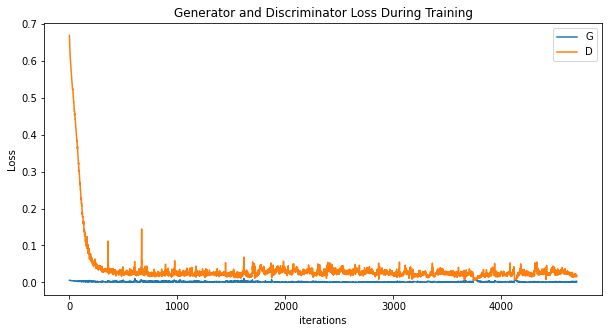

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(g_losses, label="G")
plt.plot(d_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## 4. Model Evaluation

Now that our models have finished training, we can evaluate their performance by evaluating qualitatively how well the discriminator $D$ can classify real and fake images and how well the gennerator can generate new images and interpolate between them. 
To this end, we first look at the first 16 images from our dataset. 
Then, we compute the encoded images, interpolate between the encodings along a straight connecting line, and then decode the interpolated encodings into images. 

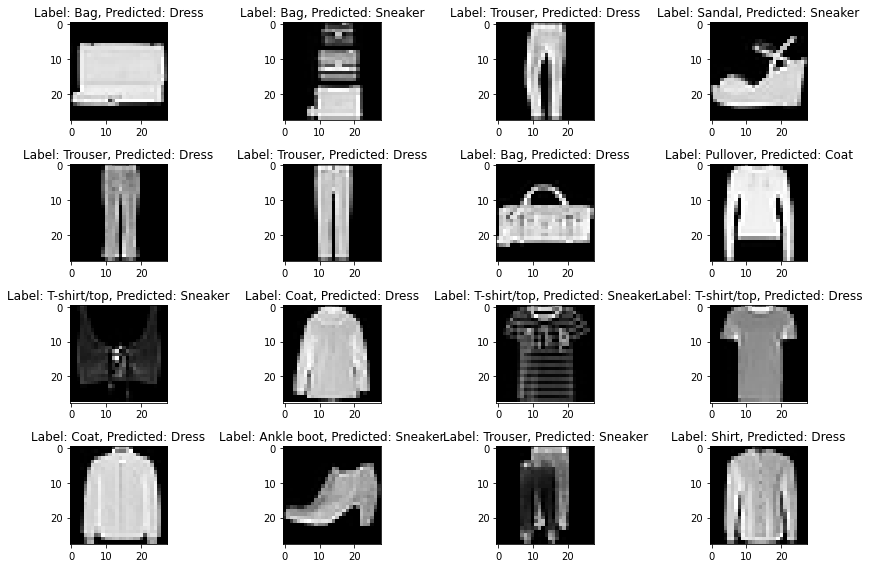

In [12]:
images, labels = dataiter.next()
fig, axes = plt.subplots(4, 4, figsize=(12, 8))
pred = torch.argmax(netD.classify(images.to(device)).cpu(), 1)
for i, ax in enumerate(axes.ravel()):
    ax.imshow(torch.squeeze(images[i].permute(1, 2, 0)), cmap="gray")
    ax.set_title(f"Label: {class_names[labels[i]]}, Predicted: {class_names[pred[i]]}")
plt.tight_layout()

In [13]:
num = 30
first = 0
second = 1

gammas = torch.zeros((num, 2))
gammas[:, 1] = torch.linspace(0, 1, num)
gammas[:, 0] = 1 - gammas[:, 1]

netG.eval()
netD.eval()

with torch.no_grad():
    encoded = netG.encode(images.to(device)).cpu()
    img1 = encoded[first]
    img2 = encoded[second]
    # March along connecting line between images
    encoded_inter = torch.tensordot(gammas, torch.stack((img1, img2), 0), [[1], [0]])
    # When marching along a ray, the labels are mixed as well as before
    labels_inter = torch.tensordot(gammas, torch.stack((F.one_hot(labels, num_classes)[first], F.one_hot(labels, num_classes)[second])).float(), [[1], [0]])
    decoded = netG.decode(encoded_inter.to(device)).cpu()

Now, we can plot the results of the classifier on these fake images. The first column shows the generated image, the second column the categorical probabilities given by the classifier and the third column shows the true labels. 
From the interpolated images, we can generate a GIF to display a smooth transition from one object into another. 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations


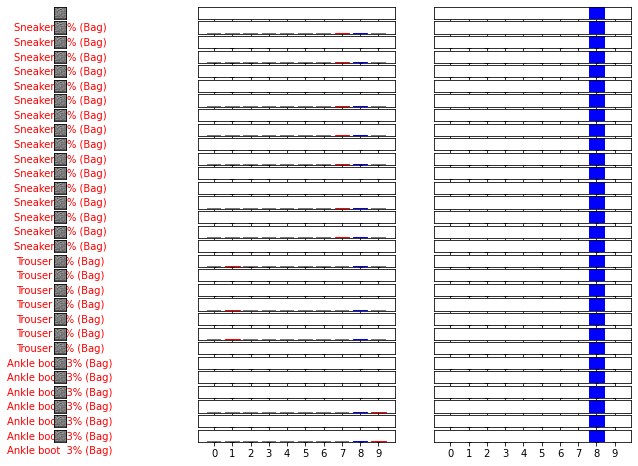

In [14]:
def plot_image(i, predictions_array, true_label, img):
    true_label, img = np.argmax(true_label[i]), img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img, cmap=plt.cm.binary)

    predicted_label = np.argmax(predictions_array)
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel("{} {:2.0f}% ({})".format(class_names[predicted_label],
                                100*np.max(predictions_array),
                                class_names[true_label]),
                                color=color)

def plot_value_array(i, predictions_array, true_label):
    true_label = true_label[i]
    plt.grid(False)
    plt.xticks(range(10))
    plt.yticks([])
    thisplot = plt.bar(range(10), predictions_array, color="#777777")
    plt.ylim([0, 1])
    predicted_label = np.argmax(predictions_array)

    thisplot[predicted_label].set_color('red')
    thisplot[np.argmax(true_label)].set_color('blue')

def make_gif(file_path, ind1, ind2, n):
    gif_images = []
    gammas = torch.zeros((n, 2))
    gammas[:, 1] = torch.linspace(0, 1, n)
    gammas[:, 0] = 1 - gammas[:, 1]

    img1 = encoded[first]
    img2 = encoded[second]
    encoded_inter = torch.tensordot(gammas, torch.stack((img1, img2), 0), [[1], [0]])
    labels_inter = torch.tensordot(gammas, torch.stack((F.one_hot(labels, num_classes)[first], F.one_hot(labels, num_classes)[second])).float(), [[1], [0]])
    decoded = netG.decode(encoded_inter.to(device)).cpu()
    imgs = torch.squeeze(torch.clip(255 * decoded, 0, 255).permute(0, 2, 3, 1)).detach().numpy().astype(np.uint8)
    for img in imgs:
        gif_images.append(img)
    
    imageio.mimsave(file_path, gif_images)

plt.figure(figsize=(12, 8))
pred = F.softmax(netD.classify(decoded.to(device)), 0).cpu()
imgs = torch.squeeze(torch.clip(255 * decoded, 0, 255).permute(0, 2, 3, 1)).detach().numpy().astype(np.uint8)
for i in range(num):
    plt.subplot(num, 3, 3 * i + 1)
    plot_image(i, pred[i].detach().numpy(), labels_inter, imgs)
    plt.subplot(num, 3, 3 * i + 2)
    plot_value_array(i, pred[i].detach().numpy(), labels_inter)
    plt.subplot(num, 3, 3 * i + 3)
    plot_value_array(i, labels_inter[i], labels_inter)
plt.tight_layout()

In [15]:
make_gif(f'interpolation{first}_{second}.gif', first, second, 60)
Image(open(f'interpolation{first}_{second}.gif', 'rb').read(), width=300, height=300)

Here, we can see how the autoencoder performs and how the discriminator can distiguish between real and fake images. 

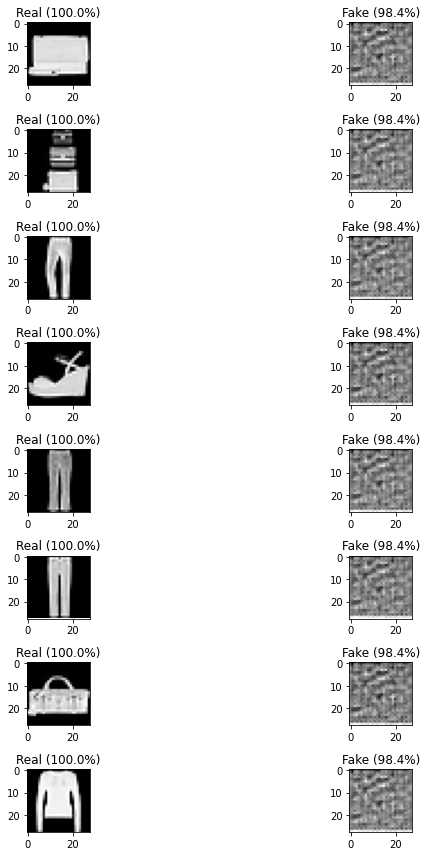

In [16]:
fig, axes = plt.subplots(8, 2, figsize=(12, 12))
encoded = netG.encode(images.to(device))
imgs = netG(images.to(device)).detach().cpu()
# fake = netG.decode(noise).detach().cpu()
for i in range(8):
    axes[i, 0].imshow(torch.squeeze(images[i].permute(1, 2, 0)), cmap='gray')
    axes[i, 0].set_title(f"Real ({100 * netD.discriminate(images[i].unsqueeze(0).to(device)).item():.1f}%)")
    axes[i, 1].imshow(torch.squeeze(imgs[i].permute(1, 2, 0)), cmap='gray')
    axes[i, 1].set_title(f"Fake ({100 * netD.discriminate(imgs[i].unsqueeze(0).to(device)).item():.1f}%)")
    # axes[i, 2].imshow(torch.squeeze(fake[i].permute(1, 2, 0)), cmap='gray')
    # axes[i, 2].set_title(f"{netD.discriminate(fake[i].unsqueeze(0).to(device)).item()}")
plt.tight_layout()

For the next part, we load all our training data into memory and encode the images. 

In [17]:
images, labels = next(iter(DataLoader(training_data, batch_size=len(training_data))))
encoded = torch.zeros((images.shape[0], 64, 1, 1))
for i in range(images.shape[0] // BATCH_SIZE + 1):
    encoded[i * BATCH_SIZE:(i+1) * BATCH_SIZE] = netG.encode(images[i * BATCH_SIZE:(i+1) * BATCH_SIZE].to(device)).detach().cpu()

### Latent Space Visualization

Since our latent space is is much lower in dimension compared to the full image space, we can embed this high-dimensional space into a lower-dimensional 2D space using PCA and t-SNE, respectively, and compare the two qualitatively. 
We will find that lots of items seems to cluster together with similar items of the same (or at least a highly related) label.
Then, we can perform SVM classification on both the full and embedded data to quantitatively compare how easily they can be separated into clusters. 
Note that PCA is a linear embedding algorithm, thus it can be applied in linear time whereas t-SNE is quadratic and will thus not be performed on the full dataset but rather a smaller subset.


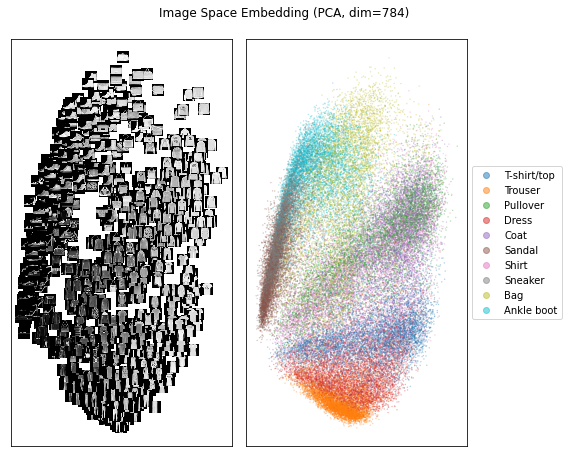

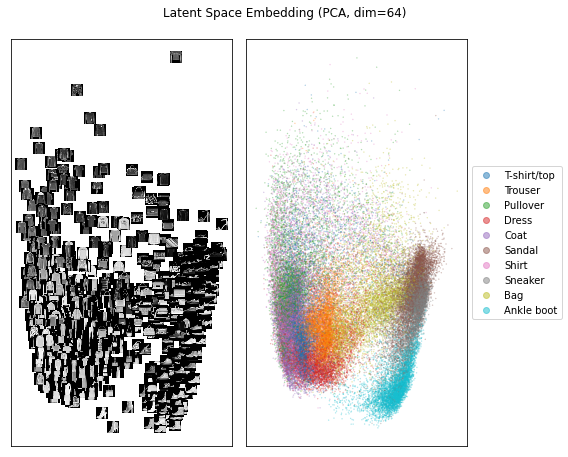

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


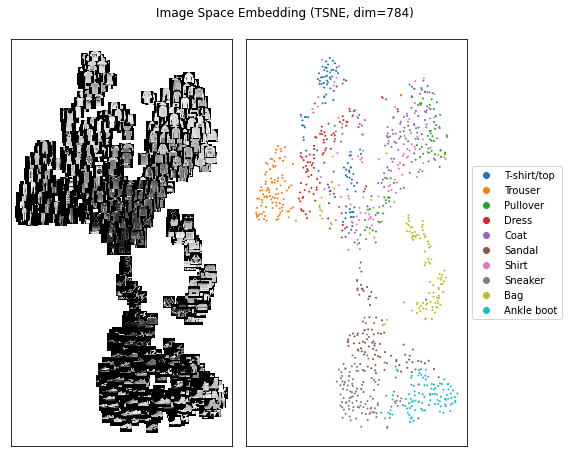

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


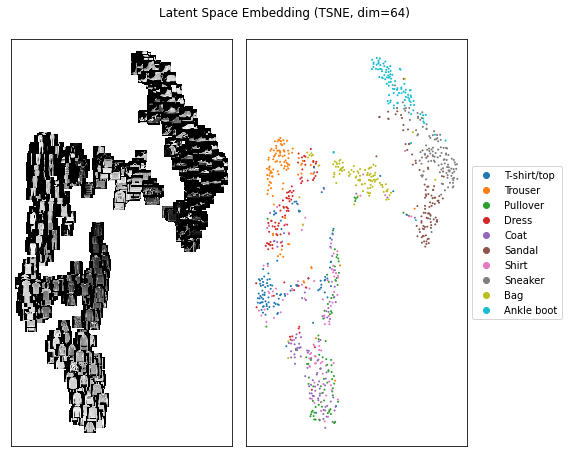

In [18]:
def format_axes(fig):
    for i, ax in enumerate(fig.axes):
        ax.text(0.5, 0.5, "ax%d" % (i+1), va="center", ha="center")
        ax.tick_params(labelbottom=False, labelleft=False)

def plot_embedding(method, x, title, num=1000, seed=42, representation='both', num_images=1000):
    np.random.seed(seed)
    if method.lower() == 'pca':
        embedder = PCA(n_components=2)
        size = 0.1
        alpha = 0.5
        num = images.shape[0]
    elif method.lower() == 'tsne':
        embedder = TSNE(n_components=2)
        size = 1
        alpha = 1
    
    if representation.lower() == 'both':
        n = 2

    title = title.strip()
    plt.figure(figsize=(8, 6))
    embedded = embedder.fit_transform(x[:num].flatten(start_dim=1).detach().cpu())

    if representation.lower() in ['both', 'color']:
        ax = plt.subplot(1, n, n)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        s = ax.scatter(embedded[:, 0], embedded[:, 1], s=size, alpha=alpha, c=labels[:num], cmap='tab10')
        plt.suptitle(f"{title} ({method}, dim={np.prod(x.shape[1:])})", y=1.05)
        ax.legend(handles=s.legend_elements()[0], labels=class_names, loc='center left', bbox_to_anchor=(1, 0.5))

    if (representation.lower() in ['both', 'image']):
        ax = plt.subplot(1, n, 1)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        s = ax.scatter(embedded[:num_images, 0], embedded[:num_images, 1], s=size, alpha=alpha, c=labels[:num_images], cmap='tab10')
        for i, img in enumerate(images[:num_images]):
            imagebox = OffsetImage(torch.squeeze(img.permute(1, 2, 0)).detach().cpu().numpy(), zoom=0.4, cmap='gray')
            imagebox.image.axes = ax
            ab = AnnotationBbox(imagebox, (embedded[i, 0], embedded[i, 1]), frameon=False)
            ax.add_artist(ab)
        plt.suptitle(f"{title} ({method}, dim={np.prod(x.shape[1:])})", y=1.05)
      
    plt.tight_layout()
    plt.show()

plot_embedding('PCA', images, "Image Space Embedding")
plot_embedding('PCA', encoded, "Latent Space Embedding")

plot_embedding('TSNE', images, "Image Space Embedding")
plot_embedding('TSNE', encoded, "Latent Space Embedding")

In [19]:
def clustering_quality(X, y, test_size=0.1, random_state=42, clf=SVC(gamma='auto'), n_classes=None):
  if n_classes is None:
    n_classes = len(torch.unique(y))

  X_train, X_test, y_train, y_test = train_test_split(X.flatten(start_dim=1), y, 
                                                      test_size=test_size, 
                                                      random_state=random_state)
  clf = make_pipeline(StandardScaler(), clf).fit(X_train, y_train)
  return clf.score(X_test, y_test)

print(f"Clustering quality for full image space: {100 * clustering_quality(images, labels):.1f}%")
print(f"Clustering quality for latent space: {100 * clustering_quality(encoded, labels):.1f}%")

Clustering quality for full image space: 89.5%
Clustering quality for latent space: 85.4%


# Conclusion

This was a bit of an excursion and experiment for myself and my first long project. 
I hope you could learn a thing or two on Deep Learning, latent space encoding, Autoencoders, and GANs along the way with me.

Unfortunately, I couldn't find a way to tweak the GAN parameters to converge nicely but will keep looking. 
Regarding the interpolation, one tricky caveat is that interpolations are not unique (see below figure) so two identical interpolated samples can have different labels which is problematic when considering a NN as a function. 
However, the example below is a septagon (7-sided) in 2D space so intersection between vertices are guaranteed. 
However, in higher dimensional spaces, this may not be the case and actually becomes more and more improbable. 
The number of vertices and latent space dimension should be carefully balanced then with a latent space dimension that is higher than the number of vertices though this hypothesis should be empirically investigated. 

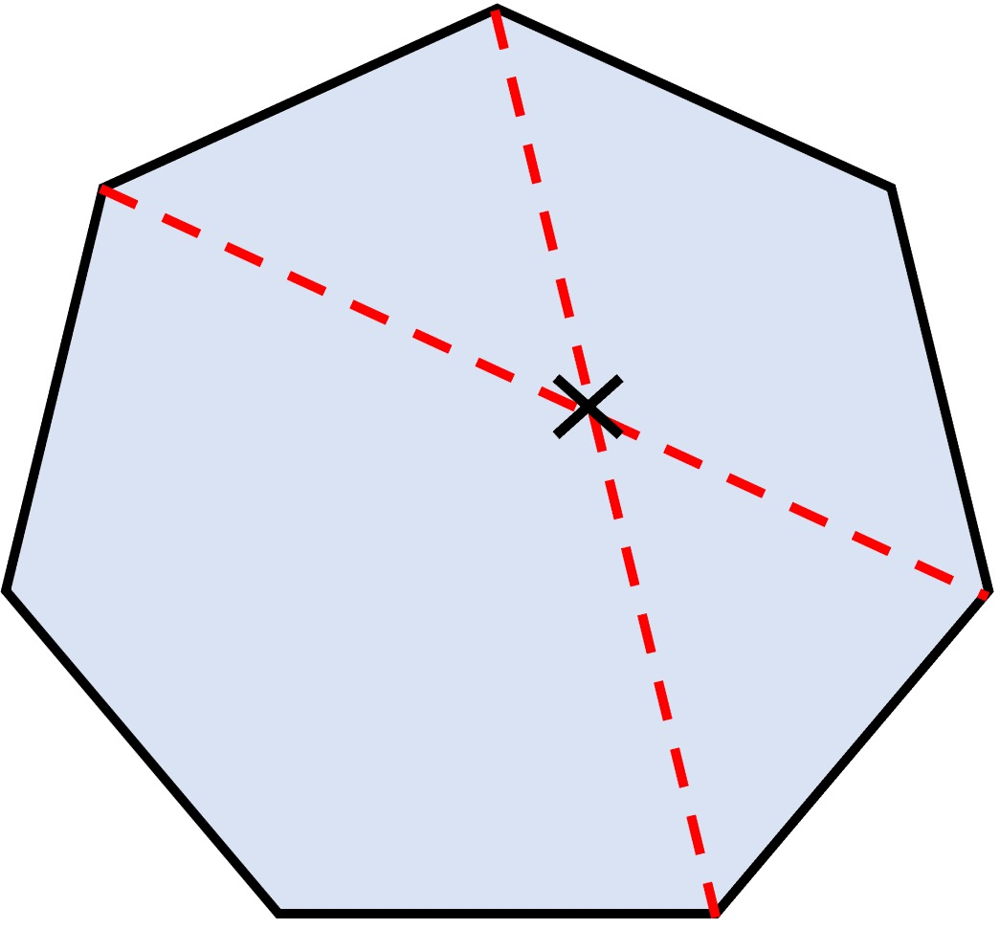